# Stochastic Wind Chimes
---
## Imports

In [30]:
import numpy as np
import scipy.signal as signal
import matplotlib.pyplot as plt
from IPython.display import Audio
from scipy.io import wavfile

import warnings
warnings.filterwarnings("ignore")

## Stochastic Wind Chimes Implementation
---
<br> 
The implementation is based on [T. Lukkari and V. Valimaki, "Modal synthesis of wind chime sounds with stochastic event triggering," Proceedings of the 6th Nordic Signal Processing Symposium, 2004. NORSIG 2004., 2004, pp. 212-215.](https://ieeexplore.ieee.org/document/1344561) <br>
Further details can be found down below.


In [31]:
class StochasticWindChimes:

  def __init__(self, fs=11025, time=25, r_decay=0.9999, c=19,
               wind_force_fn=None):
    self.fs = fs
    self.time = time
    self.r_decay = r_decay
    self.c=19

    self.state_dict = {
        0: ((0, 1, 2, 3, 4, 5), lambda p: (1-p, p/5, p/5, p/5, p/5, p/5)),
        1: ((0, 2, 5), lambda p: (1-p, p/2, p/2)),
        2: ((0, 3, 1), lambda p: (1-p, p/2, p/2)),
        3: ((0, 2, 4), lambda p: (1-p, p/2, p/2)),
        4: ((0, 5, 3), lambda p: (1-p, p/2, p/2)),
        5: ((0, 4, 1), lambda p: (1-p, p/2, p/2))
    }

    self.tube_dict = {
        1: (np.random.randint(1, 6), (219.8, 590.2, 1115.4, 1766.2, 2513.9)),
        2: (np.random.randint(1, 6), (245.8, 657.6, 1239.2, 1955.3, 2773.1)),
        3: (np.random.randint(1, 6), (293.9, 782.4, 1465.2, 2311.8, 3278.8)),
        4: (np.random.randint(1, 6), (331.6, 875.5, 1633.0, 2576.5, 3654.2)),
        5: (np.random.randint(1, 6), (366.1, 967.5, 1794.2, 2831.0, 4015.1))
    }

    self.mode_duration = (40, 7, 2, 1, .5)
    self.mode_gains = (.0787, .1849, 1., .0136, .0275)
    self.mode_r = (.99996867280237, .99982100066035, .99937364247702, 
                   .99874767727779, .99749714959934)
    
    if wind_force_fn is not None:
      self._wind_force = wind_force_fn
    

  def _wind_force(self, t):
      if 5 < t < 10:
        return 2 / 5 * (t - 5)
      elif 10 <= t < 20:
        return 2
      return 0


  def _generate_energy(self):
    d = 1 / self.fs * np.array([self._wind_force(sample_no / self.fs) for 
                                sample_no in np.arange(0, self.time * self.fs)])
    E = [0, ]
    for i in range(d.size):
      E.append(self.r_decay * (E[-1] + d[i]))
    E = np.array(E[1:])

    return E


  def _get_probability(self, E):
    return 1 / (1 + self.c * np.exp(-2 * E))


  def _generate_noise(self, t=2e-2, fs=11025, alpha=.1, R=.97):
    n = int(t * fs)
    noise = np.random.normal(size=n)
    noise = noise / np.max(noise)
    noise = alpha * R ** np.arange(n) * noise
    return noise


  def _get_resonator_coeff(self, f0, G, R):
    cos = 2 * R / (1 + R ** 2) * np.cos(2 * np.pi * f0 / self.fs)
    theta = np.arccos(cos)
    A = (1 + R ** 2) * np.sin(theta)
    b = np.array([G*A, 0, -G*A])
    a = np.array([1, -2*R*cos, R**2])
    return b, a


  def plot_probability_curve(self):
    plt.figure(figsize=(20, 4))
    plt.plot(self._get_probability(self._generate_energy()))
    plt.title("Hit Probability Curve")
    plt.ylabel("Hit Probability")
    plt.xlabel("Time [s]")
    plt.xticks(np.arange(self.fs * self.time + 1, step=5 * self.fs), 
               np.arange(self.time + 1, step=5))
    plt.show()


  def plot_wind_force_curve(self):
    plt.figure(figsize=(20, 4))
    plt.plot(np.array([self._wind_force(sample_no / self.fs) for sample_no 
                                in np.arange(0, self.time * self.fs)]))
    plt.title("Wind Force Function")
    plt.ylabel("Wind Force")
    plt.xlabel("Time [s]")
    plt.xticks(np.arange(self.fs * self.time + 1, step=5 * self.fs), 
               np.arange(self.time + 1, step=5))
    plt.show()


  def plot_energy_curve(self):
    plt.figure(figsize=(20, 4))
    plt.plot(self._generate_energy())
    plt.title("Energy Curve")
    plt.ylabel("Energy")
    plt.xlabel("Time [s]")
    plt.xticks(np.arange(self.fs * self.time + 1, step=5 * self.fs), 
               np.arange(self.time + 1, step=5))
    plt.show()


  def plot_spectrogram(self):
    if not hasattr(self, "output"):
      raise AttributeError("Output not generated! Generate the output first.")

    plt.figure(figsize=(20, 9))
    plt.specgram(self.output, Fs=self.fs)
    plt.title("Output Spectrogram")
    plt.ylabel("Frequency [Hz]")
    plt.xlabel("Time [s]")
    plt.show()


  def plot_output(self):
    if not hasattr(self, "output"):
      raise AttributeError("Output not generated! Generate the output first.")

    plt.figure(figsize=(20, 5))
    plt.plot(self.output)
    plt.title("Output Waveform")
    plt.xlabel("Time [s]")
    plt.xticks(np.arange(self.output.size, step=5 * self.fs), 
               np.arange(self.output.size // self.fs + 1, step=5))
    plt.show()


  def generate(self):
    check_array = []
    curr = 0
    E = self._generate_energy()
    while True:
      interval = np.random.randint(3e-2 * self.fs, 5e-2 * self.fs)
      curr += interval
      if curr >= E.size:
        break
      check_array.append(curr)

    curr_state = 0
    output = np.zeros(E.size + 40 * self.fs)

    for check_sample in check_array:
      p = self._get_probability(E[check_sample])
      curr_state = np.random.choice(self.state_dict[curr_state][0], 
                                    p=self.state_dict[curr_state][1](p))
      if curr_state == 0:
        continue
      else:
        n, frequencies = self.tube_dict[curr_state]
        sound = np.zeros(int(self.fs * max(self.mode_duration)))
        noise = self._generate_noise()
        sound[:noise.size] = noise
        for mode_freq, R, G in zip(frequencies, self.mode_r, self.mode_gains):
          b, a = self._get_resonator_coeff(mode_freq, G, R)
          sound = signal.lfilter(b, a, sound)
        output[check_sample:check_sample + sound.size] += sound

    self.output = output
    
    return output
    
chimes = StochasticWindChimes()

### Energy Update Rule
---
<br>
Energy of the clapper is given by:
$$E_n = R_{decay}(E_{n-1}+d_n)$$
where $E_n$ is the energy of the system at sample number $n$. <br>
In our case we use $f_s=11025\;\text{Hz}$ with $R_{decay} = 0.9999$. <br>
Furthermore, $d_n$ describes the derivative of the system energy and can be approximated as:
$$d_n = T_sf((n-1)T_s)$$
where $T_s$ is the sampling interval. <br>
Wind force is given by:
$$f(t)=\left\{\begin{array}{@{}l@{}}
    0 \qquad \qquad \text{if}\; 0 \le t \le 5\;\text{or}\; t > 20\text{,}\\
    \frac{2}{5}(t-5) \quad \text{if}\; 5 \le t \le 10\text{,}\\
    2 \qquad \qquad \text{if}\; 10 \le t \le 20
  \end{array}\right.\,.$$

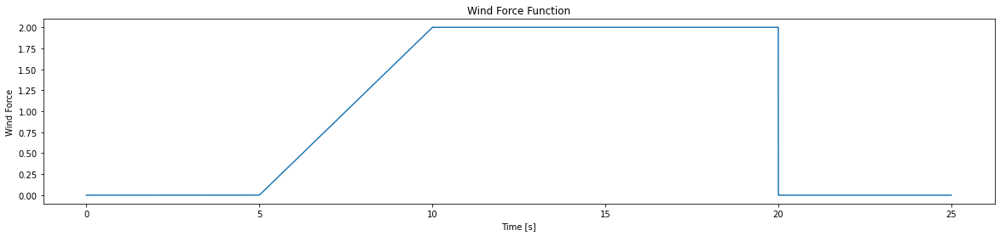

In [32]:
chimes.plot_wind_force_curve()

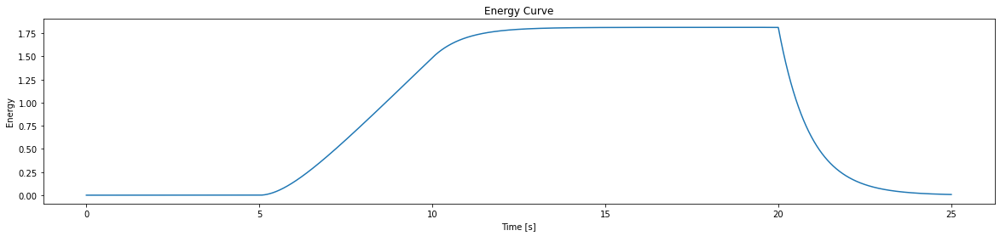

In [33]:
chimes.plot_energy_curve()

### Stochastic State Transition
---
We model the motion of the clapper using a state machine. <br>
The probability of the hit increases with the wind force factor and the energy of the clapper. <br>
In order to make the sound more natural, transitions of the states are checked for at a random time intervals between 0.03 and 0.05 seconds. <br>
Probability of a hit is calculated with the following formula based on the energy of the clapper:
$$
p(E_{n}) = \frac{1}{1 + c\cdot exp(-2E_{n})}
$$
where n is the time index and $c$ is the constant, used in order to obtain convenient value of $p$. In our case, we use the value $c = 99$.

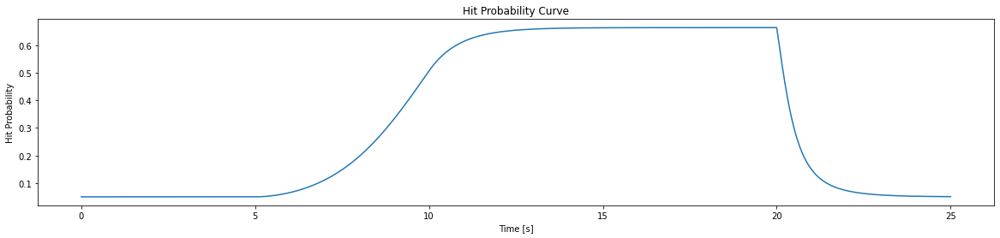

In [34]:
chimes.plot_probability_curve()

### Sound Generation Using Resonators
---

To generate the sound we use a sum of exponentially decaying sinusoids that correspond to the modes of the tubes. <br>
Each of the modes is represented by a resonator which can be described by the following transfer function:
$$H(z) = \frac{GA_0(1-z^{-2})}{1 - 2Rcos(\theta)z^{-1} + R^2z^{-2}}.$$
Moreover, $\theta$ is related to the resonance angular frequency $\omega_0$ and the pole radius by 
$$cos(\theta) = \frac{2R}{1 + R^2}cos(\omega_0).$$
$A_0$ is a normalization factor used to get maximum gain of 0 dB. <br>
It is given by:
$$A_0=(1+R^2)sin(\theta).$$
G is the gain factor used to control the levels of each mode relative to each other. <br>
Each time an event is triggered, a burst of noise is fed through a cascade of resonators, each corresponding to one of the modes. <br>
The noise is described by:
$$x(k)=aR^k_{\text{input}}n_k$$
where $R_\text{input} < 1$. $a$ reflects the speed of the clapper and is given by:
$$a=\sqrt{E+\alpha}$$
where $E$ is the system energy.

#### Mode Information
---
<br>
Each tube's mode frequencies in Hz:

| Mode    | 1     | 2     | 3      | 4      | 5      |
|---------|-------|-------|--------|--------|--------|
| Tube #1 | 219.8 | 590.2 | 1115.4 | 1766.2 | 2513.9 |
| Tube #2 | 245.8 | 657.6 | 1239.2 | 1955.3 | 2773.1 |
| Tube #3 | 293.9 | 782.4 | 1465.2 | 2311.8 | 3278.8 |
| Tube #4 | 331.6 | 875.5 | 1633.0 | 2576.5 | 3654.2 |
| Tube #5 | 366.1 | 957.5 | 1794.2 | 2831.0 | 4015.1 |

<br>
Mode gains:

| Mode |    1   |    2   |    3   |    4   |    5   |
|:----:|:------:|:------:|:------:|:------:|:------:|
| Gain | 0.0787 | 0.1849 | 1.0000 | 0.0136 | 0.0275 |

<br>
60 dB decay times ($T_{60}$) and corresponding pole radii R for sampling frequency $f_s = 11025\;\text{Hz}$:

| Mode | $T_{60}$, s | R                |
|------|-------------|------------------|
| 1    | 40          | 0.99996867280237 |
| 2    | 7           | 0.99982100066035 |
| 3    | 2           | 0.99937364247702 |
| 4    | 1           | 0.99874767727779 |
| 5    | 0.5         | 0.99749714959934 |

In [35]:
output = chimes.generate()
Audio(output, rate=11025)

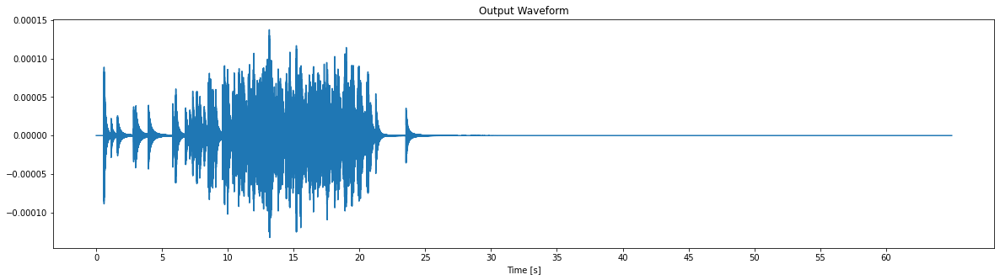

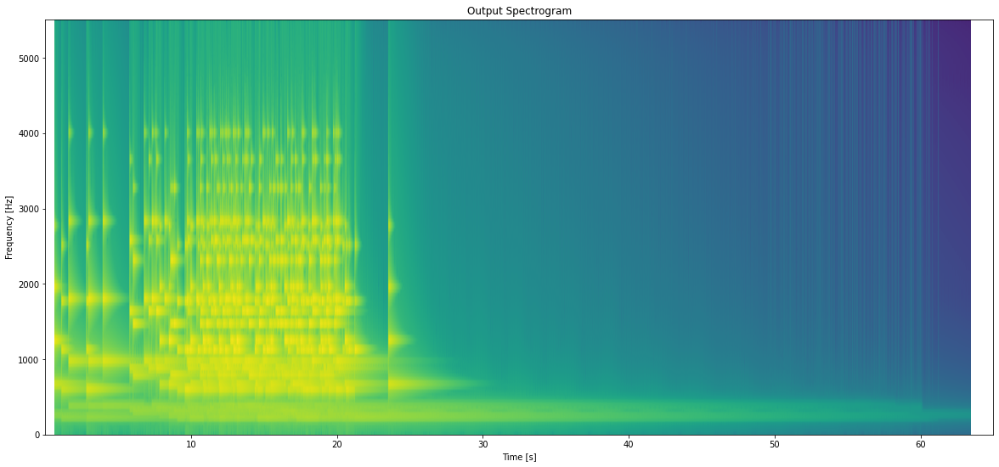

In [36]:
chimes.plot_output()
chimes.plot_spectrogram()

### Experiments
---

Tunnel impulse response convolution:

In [37]:
sr, tunnel_ir = wavfile.read("tunnel_IR.wav")
tunnel_output = np.convolve(output, tunnel_ir)
Audio(tunnel_output, rate=11025)

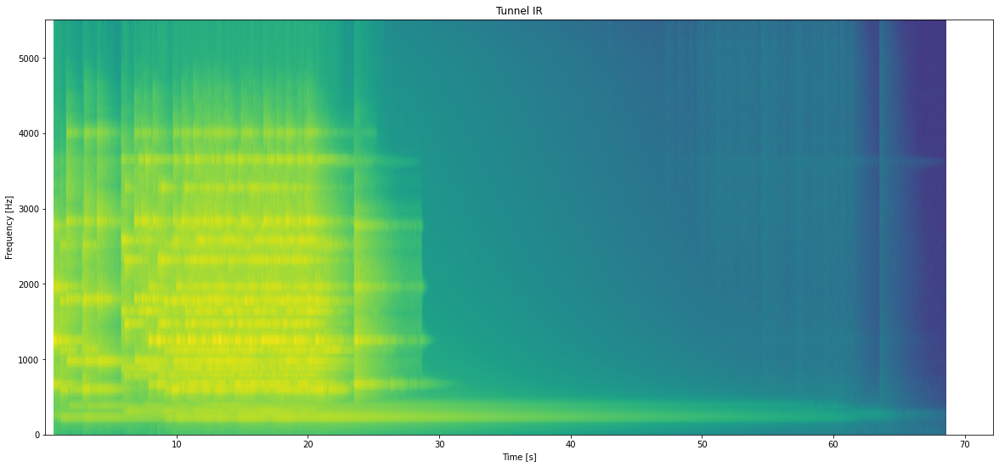

In [38]:
plt.figure(figsize=(20, 9))
plt.title("Tunnel IR")
plt.specgram(tunnel_output, Fs=11025)
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [s]")
plt.show()

Garage impulse response convolution:

In [39]:
_, garage_ir = wavfile.read("garage_IR.wav")
garage_output = np.convolve(output, garage_ir)
Audio(garage_output, rate=11025)

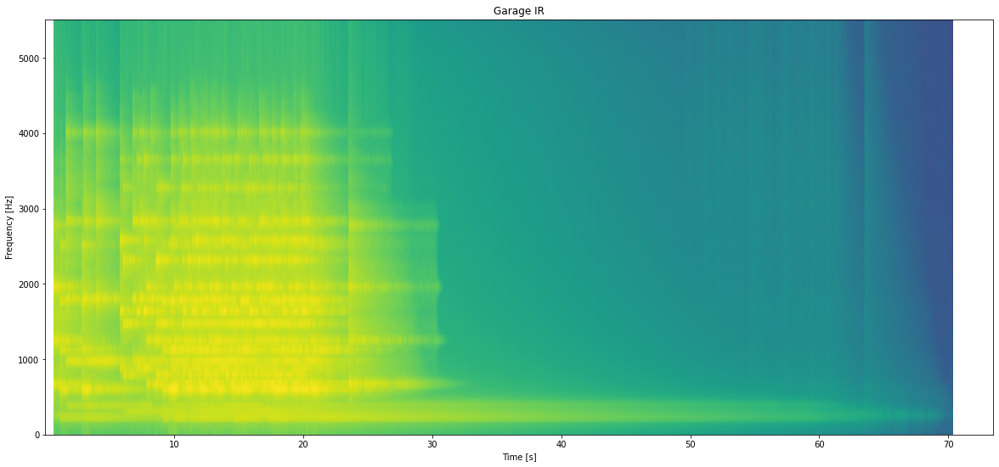

In [40]:
plt.figure(figsize=(20, 9))
plt.title("Garage IR")
plt.specgram(garage_output, Fs=11025)
plt.ylabel("Frequency [Hz]")
plt.xlabel("Time [s]")
plt.show()

Sawtooth wind force function:

In [41]:
def saw_wind_force(t):
    if 5 < t < 15:
      return 2 / 5 * (t - 5)
    if 25 < t < 35:
      return 2 / 5 * (t - 25)
    return 0

chimes_saw = StochasticWindChimes(time=50, wind_force_fn=saw_wind_force)
output_saw = chimes_saw.generate()
Audio(output_saw, rate=11025)

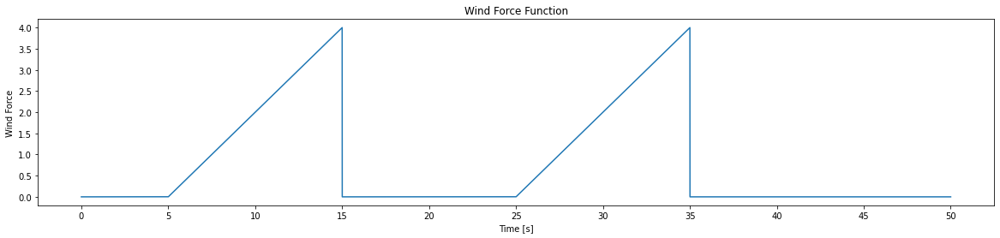

In [42]:
chimes_saw.plot_wind_force_curve()

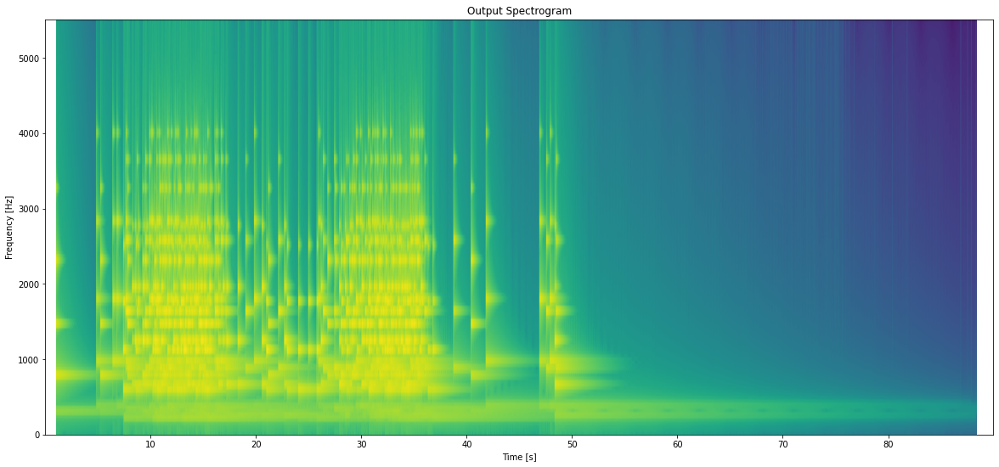

In [43]:
chimes_saw.plot_spectrogram()